In [0]:
# Import packages
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras import layers as ls
from keras.applications import VGG19
from keras.applications.vgg19 import preprocess_input
from keras.optimizers import Adam
from keras import backend as K
import tensorflow as tf

import numpy as np
import os, os.path
import matplotlib.pyplot as plt

from google.colab import files
from google.colab import drive
drive.mount('/content/drive')

class MPSRGAN:
    def __init__(self, hr_size=(256, 256), lr_size=(64, 64), channels=3, batch_size=16,
                 train_hr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/train_hr', 
                 train_lr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/train_lr', 
                 valid_hr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/valid_hr', 
                 valid_lr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/valid_lr', 
                 test_hr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/test_hr', 
                 test_lr_dir='/content/drive/My Drive/Colab Notebooks/DL_project/test_lr',
                 discriminator_filters=64, generator_filters=64):
        
        self.hr_size = hr_size
        self.lr_size = lr_size
        self.channels = channels
        self.batch_size = batch_size
        self.train_hr_dir = train_hr_dir
        self.train_lr_dir = train_lr_dir
        self.valid_hr_dir = valid_hr_dir
        self.valid_lr_dir = valid_lr_dir
        self.test_hr_dir = test_hr_dir
        self.test_lr_dir = test_lr_dir
        self.generator_filter_size = generator_filters
        self.discriminator_filter_size = discriminator_filters
        self.number_of_train_imgs = len(os.listdir(train_lr_dir + '/train_lr')) # this is for the train loop (see it later)
        self.number_of_test_imgs = len(os.listdir(test_lr_dir + '/test_lr'))
        self.val_g_loss_best = 1000 # this is a very high value therefore the first model will overwrite it sure (see it later)

        # Creating optimizer
        self.optimizer = Adam(0.0002, beta_1=0.9)

        # Creating data loaders
        print("Creating data loaders")
        self.train_generator_lr, self.train_generator_hr, self.valid_generator_lr, \
        self.valid_generator_hr, self.test_generator_lr, self.test_generator_hr = self.build_data_generators()
        print("Data loaders ready")

        # Creating models
        print("Building model")
        self.VGG19 = self.build_VGG19()
        self.VGG19.compile(loss='mse', optimizer=self.optimizer)
        print("VGG19 ready")

        self.generator = self.build_generator()
        self.generator.compile(loss='mse', optimizer=self.optimizer)
        print("Generator ready")

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', optimizer=self.optimizer)
        print("Discriminator ready")

        self.combined = self.build_combined()
        self.combined.compile(loss=['binary_crossentropy', 'mse'], loss_weights=[1e-3, 0.006], optimizer=self.optimizer)
        print("Combined model ready")

        # Create csv file for loss logs 
        with open('MPSRGAN-log.csv', 'w') as csv_file:
            csv_file.write('step' + ';')
            csv_file.write('d_loss_r' + ';')
            csv_file.write('d_loss_f' + ';')
            csv_file.write('g_loss_d' + ';')
            csv_file.write('g_loss_vgg' + ';')
            csv_file.write('g_loss_full' + ';')
            csv_file.write('val_d_loss_r' + ';')
            csv_file.write('val_d_loss_f' + ';')
            csv_file.write('val_g_loss_d' + ';')
            csv_file.write('val_g_loss_vgg' + ';')
            csv_file.write('val_g_loss_full' + '\n')
       

    def PSNR(self, y_true, y_pred):
        return -10.0*K.log(K.mean(K.square(y_pred - y_true))) / K.log(10.0) 


    def build_data_generators(self):
        d = ImageDataGenerator()

        train_generator_lr = d.flow_from_directory(
            self.train_lr_dir,
            target_size=self.lr_size,
            batch_size=self.batch_size,
            class_mode=None,
            shuffle=False)

        train_generator_hr = d.flow_from_directory(
            self.train_hr_dir,
            target_size=self.hr_size,
            batch_size=self.batch_size,
            class_mode=None,
            shuffle=False)
        
        valid_generator_lr = d.flow_from_directory(
            self.valid_lr_dir,
            target_size = self.lr_size,
            batch_size = self.batch_size,
            class_mode=None,
            shuffle=False)
        
        valid_generator_hr = d.flow_from_directory(
            self.valid_hr_dir,
            target_size = self.hr_size,
            batch_size = self.batch_size,
            class_mode=None,
            shuffle=False)
        
        test_generator_lr = d.flow_from_directory(
            self.test_lr_dir,
            target_size = self.lr_size,
            batch_size = 1,
            class_mode=None,
            shuffle=False)

        test_generator_hr = d.flow_from_directory(
            self.test_hr_dir,
            target_size = self.hr_size,
            batch_size = 1,
            class_mode=None,
            shuffle=False)

        return train_generator_lr, train_generator_hr, valid_generator_lr, valid_generator_hr, test_generator_lr, test_generator_hr


    def build_generator(self):
        def residual_block(layer_input, filters):
            d = ls.Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = ls.Activation('relu')(d)
            d = ls.BatchNormalization(momentum=0.8)(d)
            d = ls.Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = ls.BatchNormalization(momentum=0.8)(d)
            d = ls.Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            u = ls.UpSampling2D(size=2)(layer_input)
            u = ls.Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(u)
            u = ls.Activation('relu')(u)
            return u

        img_lr = ls.Input(shape=self.lr_size + (self.channels,))

        c1 = ls.Conv2D(self.generator_filter_size, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = ls.Activation('relu')(c1)

        r = residual_block(c1, self.generator_filter_size)

        for _ in range(16 - 1):
            r = residual_block(r, self.generator_filter_size)

        c2 = ls.Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = ls.BatchNormalization(momentum=0.8)(c2)
        c2 = ls.Add()([c2, c1])

        u1 = deconv2d(c2)
        u2 = deconv2d(u1)

        gen_hr = ls.Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(u2)

        return Model(img_lr, gen_hr)


    def build_discriminator(self):
        def d_block(layer_input, filters, strides=1, bn=True):
            d = ls.Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = ls.LeakyReLU(alpha=0.2)(d)
            if bn:
                d = ls.BatchNormalization(momentum=0.8)(d)
            return d

        d0 = ls.Input(shape=self.hr_size + (self.channels,))

        d1 = d_block(d0, self.discriminator_filter_size, bn=False)
        d2 = d_block(d1, self.discriminator_filter_size, strides=2)
        d3 = d_block(d2, self.discriminator_filter_size * 2)
        d4 = d_block(d3, self.discriminator_filter_size * 2, strides=2)
        d5 = d_block(d4, self.discriminator_filter_size * 4)
        d6 = d_block(d5, self.discriminator_filter_size * 4, strides=2)
        d7 = d_block(d6, self.discriminator_filter_size * 8)
        d8 = d_block(d7, self.discriminator_filter_size * 8, strides=2)

        d9 = ls.Dense(self.discriminator_filter_size * 16)(d8)
        d10 = ls.LeakyReLU(alpha=0.2)(d9)
        validity = ls.Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)


    def build_VGG19(self):
        vgg = VGG19(weights="imagenet")
        vgg.outputs = [vgg.layers[9].output]
        img = ls.Input(shape=self.hr_size + (self.channels,))
        img_features = vgg(img)
        model = Model(img, img_features)
        model.trainable = False
        return model


    def build_combined(self):
        img_lr = ls.Input(shape=self.lr_size + (self.channels,))
        fake_hr = self.generator(img_lr)
        self.discriminator.trainable = False
        validity = self.discriminator(fake_hr)
        vgg_input = ls.Lambda(lambda fake_hr: preprocess_input(tf.math.add(fake_hr, 1)*127.5))(fake_hr)
        fake_features = self.VGG19(vgg_input)

        return Model(img_lr, [validity, fake_features])


    def rescale_to_original(self, x):
        return (x+1)*127.5

    # Create training process: continous train loads the last saved weights at first, we can specify the periods to log the training losses with log_loss_iter and the period for validation with validation_iter
    def train(self, epochs=10, show_images=False, continous_train=False, log_loss_iter=1, validation_iter=10):
        if continous_train:
            self.generator.load_weights(self.last_generator)
            self.discriminator.load_weights(self.last_discriminator)

        print('Start training')
        for cnt in range(epochs):
            for iteration in range(self.number_of_train_imgs // self.batch_size): # There is a bug in the code of flow_from_directory and the iteration never stops therefore we must specify the loop number
                #K.set_learning_phase(1) # Need to unfreeze batch-normalization layers during training
                images_lr = self.train_generator_lr.next()
                images_hr = self.train_generator_hr.next()

                # Process input images
                images_lr = preprocess_input(np.copy(images_lr), mode="tf") # preprocess_input works in-place so we need copies not to overwrite the original ones
                images_hr_vgg = preprocess_input(np.copy(images_hr))
                images_hr = preprocess_input(np.copy(images_hr), mode="tf")
                
                # Train discriminator
                fake_hr = self.generator.predict_on_batch(images_lr)

                valid = np.ones((len(images_lr),) + (16, 16, 1))
                fake = np.zeros((len(images_lr),) + (16, 16, 1))

                d_loss_real = self.discriminator.train_on_batch(images_hr, valid)
                d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
                d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

                # Train generator
                image_features = self.VGG19.predict_on_batch(images_hr_vgg)

                g_loss = self.combined.train_on_batch(images_lr, [valid, image_features])

                # Run validation in specified periods
                if iteration % validation_iter == 0: 
                    #K.set_learning_phase(0) # Need to freeze batch-normalization layers during testing
                    val_images_lr = self.valid_generator_lr.next()
                    val_images_hr = self.valid_generator_hr.next()

                    val_images_lr = preprocess_input(np.copy(val_images_lr), mode="tf")
                    val_images_hr_vgg = preprocess_input(np.copy(val_images_hr))
                    val_images_hr = preprocess_input(np.copy(val_images_hr), mode="tf")

                    val_fake_hr = self.generator.predict_on_batch(val_images_lr)
                    
                    val_valid = np.ones((len(val_images_lr),) + (16, 16, 1))
                    val_fake = np.zeros((len(val_images_lr),) + (16, 16, 1))

                    val_d_loss_real = self.discriminator.test_on_batch(val_images_hr, val_valid)
                    val_d_loss_fake = self.discriminator.test_on_batch(val_fake_hr, val_fake)
                    val_d_loss = 0.5*np.add(val_d_loss_real, val_d_loss_fake)

                    val_image_features = self.VGG19.predict_on_batch(val_images_hr_vgg)
                    
                    val_g_loss = self.combined.test_on_batch(val_images_lr, [valid, val_image_features])

                # Append training losses to the .csv file  
                if iteration % log_loss_iter == 0:
                    with open('MPSRGAN-log.csv', 'a') as csv_file:
                        csv_file.write('ep' + str(cnt+1) + 'it' + str(iteration+1) + ';')
                        csv_file.write(str(d_loss_real) + ';')
                        csv_file.write(str(d_loss_fake) + ';')
                        csv_file.write(str(g_loss[1]) + ';')
                        csv_file.write(str(g_loss[2]) + ';')
                        csv_file.write(str(g_loss[0]) + ';')
                        csv_file.write(str(val_d_loss_real) + ';')
                        csv_file.write(str(val_d_loss_fake) + ';')
                        csv_file.write(str(val_g_loss[1]) + ';')
                        csv_file.write(str(val_g_loss[2]) + ';')
                        csv_file.write(str(val_g_loss[0]) + '\n')

                    print ('TR | ep{}iter{} | Discriminator loss: {} | Generator loss: {}'.format((cnt+1),
                                                                                                           (iteration+1),
                                                                                                           float("{0:.7f}".format(d_loss)),
                                                                                                           float("{0:.7f}".format(g_loss[0]))))
                    
                    if iteration % validation_iter == 0:
                        print ('VA | Discriminator loss: {} | Generator loss: {}'.format(float("{0:.7f}".format(val_d_loss)),
                                                                                                float("{0:.7f}".format(val_g_loss[0]))))
                        # Check the generator loss and overwrite the best value if the current is better
                        # Save the model weights and save the name of them
                        if val_g_loss[0] < self.val_g_loss_best:
                            self.val_g_loss_best = val_g_loss[0]

                            self.generator.save_weights('/content/drive/My Drive/Colab Notebooks/DL_project/Generator weights/generator_weights_epoch{}_iter{}.h5'.format(cnt+1, iteration+1))
                            self.discriminator.save_weights('/content/drive/My Drive/Colab Notebooks/DL_project/Discriminator weights/discriminator_weights_epoch{}_iter{}.h5'.format(cnt+1, iteration+1))
                            
                            self.last_generator = '/content/drive/My Drive/Colab Notebooks/DL_project/Generator weights/generator_weights_epoch{}_iter{}.h5'.format(cnt+1, iteration+1)
                            self.last_discriminator = '/content/drive/My Drive/Colab Notebooks/DL_project/Discriminator weights/discriminator_weights_epoch{}_iter{}.h5'.format(cnt+1, iteration+1)
                            print('Model saved')
                    
                    if show_images:
                        plt.figure(figsize=(15, 15))
                        plt.subplot(1,3,1)
                        plt.title('original')
                        plt.imshow(self.rescale_to_original(images_hr[0]).astype(np.uint8))

                        plt.subplot(1,3,2)
                        plt.title('generated: {}. epoch'.format((cnt+1)))
                        plt.imshow(self.rescale_to_original(fake_hr[0]).astype(np.uint8))

                        plt.subplot(1,3,3)
                        plt.title('input')
                        plt.imshow(self.rescale_to_original(images_lr[0]).astype(np.uint8))
                        plt.show()

    # Create testing process
    def test(self):
        #K.set_learning_phase(0)
        self.generator.load_weights(self.last_generator)
        self.discriminator.load_weights(self.last_discriminator)

        for _ in range(self.number_of_test_imgs):
            images_lr = self.test_generator_lr.next()
            images_hr = self.test_generator_hr.next()

            # Process input images
            images_lr = preprocess_input(np.copy(images_lr), mode="tf")
            images_hr_vgg = preprocess_input(np.copy(images_hr))
            images_hr = preprocess_input(np.copy(images_hr), mode="tf")

            image_features = self.VGG19.predict_on_batch(images_hr_vgg)
            fake_hr = self.generator.predict_on_batch(images_lr)
            valid = np.ones((len(images_lr),) + (16, 16, 1))

            test_loss = self.combined.test_on_batch(images_lr, [valid, image_features])
            print ('Generator loss (D): {} | Generator loss (VGG19): {}'.format(float("{0:.7f}".format(test_loss[1])),
                                                                                float("{0:.7f}".format(test_loss[2]))))

            plt.figure(figsize=(15, 15))
            plt.subplot(1,3,1)
            plt.title('original')
            plt.imshow(self.rescale_to_original(images_hr[0]).astype(np.uint8))

            plt.subplot(1,3,2)
            plt.title('generated')
            plt.imshow(self.rescale_to_original(fake_hr[0]).astype(np.uint8))

            plt.subplot(1,3,3)
            plt.title('input')
            plt.imshow(self.rescale_to_original(images_lr[0]).astype(np.uint8))

            plt.show()

Using TensorFlow backend.


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
srgan = MPSRGAN()

Creating data loaders
Found 5501 images belonging to 1 classes.
Found 5501 images belonging to 1 classes.
Found 550 images belonging to 1 classes.
Found 550 images belonging to 1 classes.
Found 50 images belonging to 1 classes.
Found 50 images belonging to 1 classes.
Data loaders ready
Building model




574717952/574710816 [==============================] - 12s 0us/step







VGG19 ready



Generator ready

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Discriminator ready
Combined model ready


In [0]:
srgan.train(epochs=10, show_images=True, continous_train=True)

Generator loss (D): 8.7551432 | Generator loss (VGG19): 32781.71875


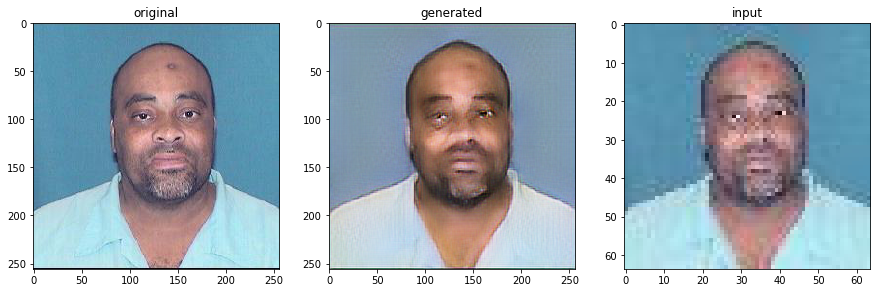

Generator loss (D): 7.7056017 | Generator loss (VGG19): 34366.1796875


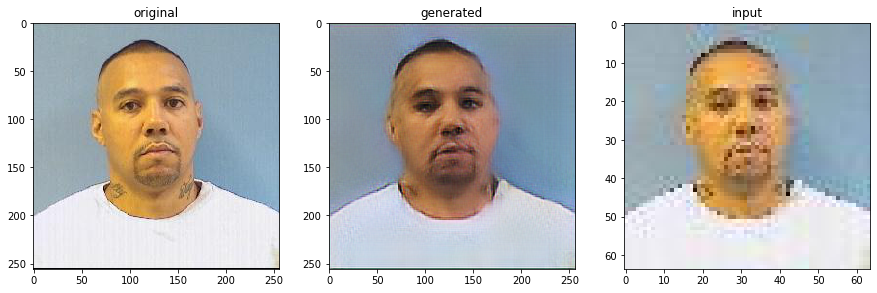

Generator loss (D): 8.2937355 | Generator loss (VGG19): 29561.6230469


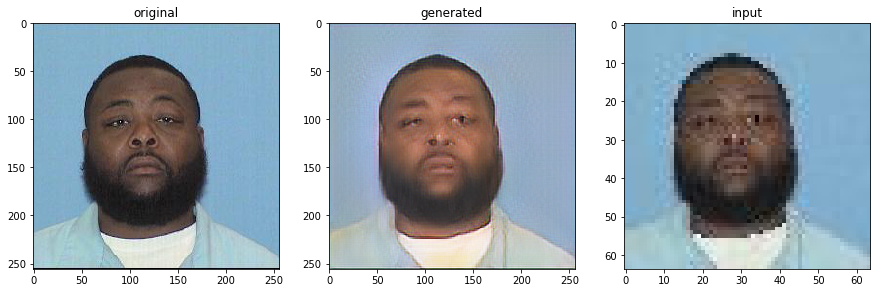

Generator loss (D): 2.5597234 | Generator loss (VGG19): 49406.0546875


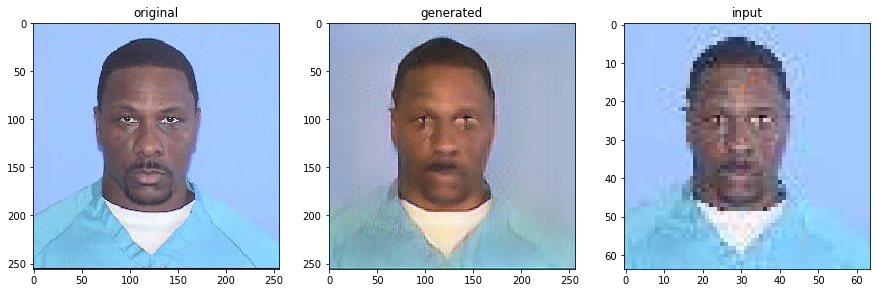

Generator loss (D): 7.5546441 | Generator loss (VGG19): 30535.03125


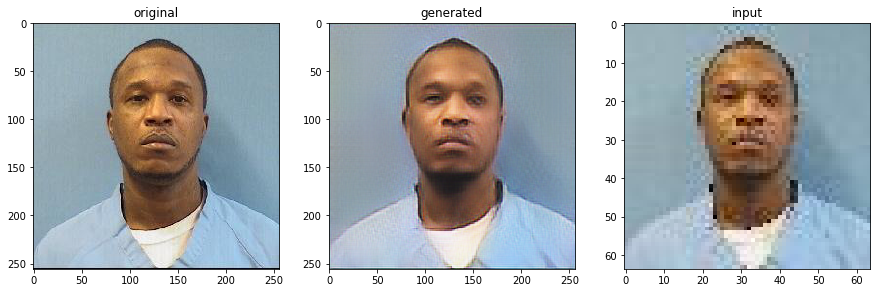

Generator loss (D): 7.2825823 | Generator loss (VGG19): 31362.765625


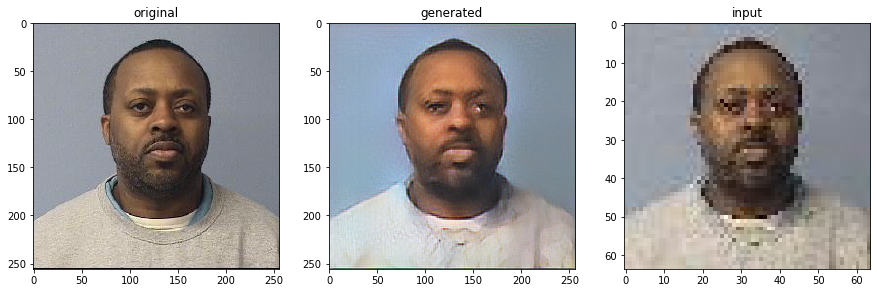

Generator loss (D): 5.7053485 | Generator loss (VGG19): 28365.9628906


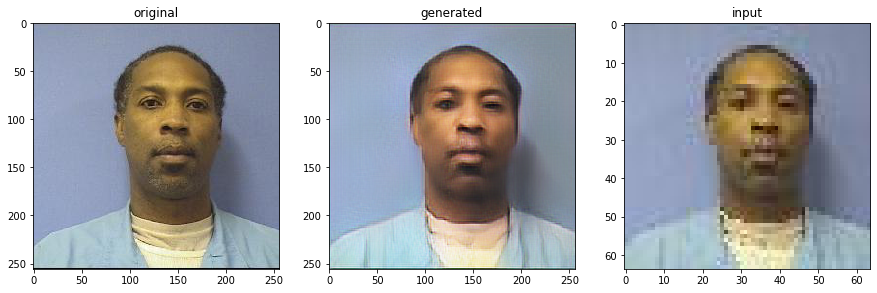

Generator loss (D): 6.5569134 | Generator loss (VGG19): 41404.9726562


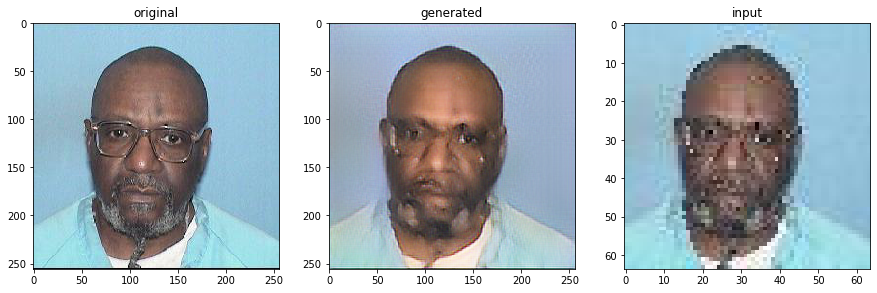

Generator loss (D): 6.8464208 | Generator loss (VGG19): 36616.5742188


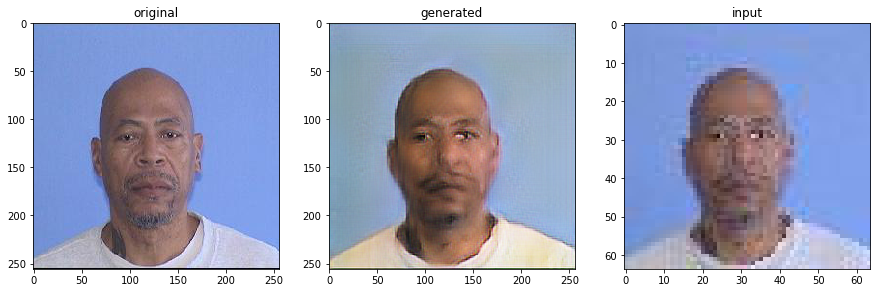

Generator loss (D): 4.62185 | Generator loss (VGG19): 56235.5664062


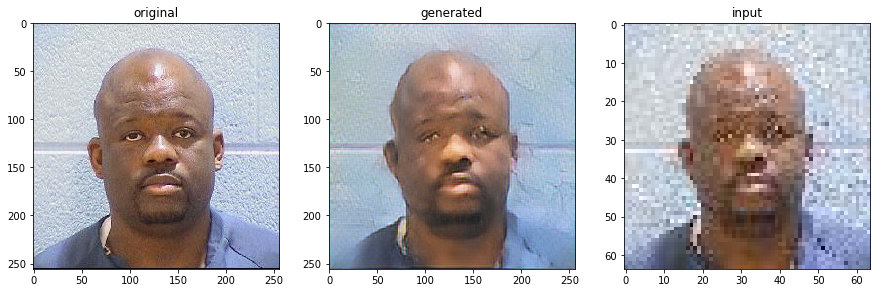

Generator loss (D): 5.8575001 | Generator loss (VGG19): 62472.6367188


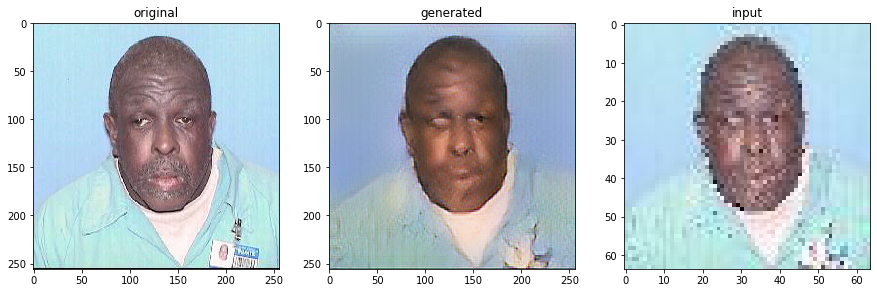

Generator loss (D): 5.4726996 | Generator loss (VGG19): 57067.484375


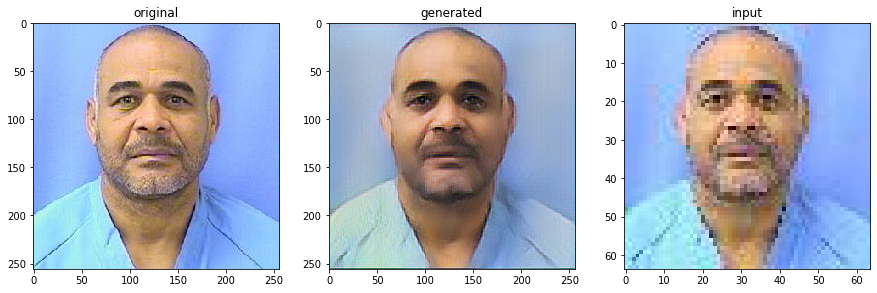

Generator loss (D): 7.8812847 | Generator loss (VGG19): 45773.3125


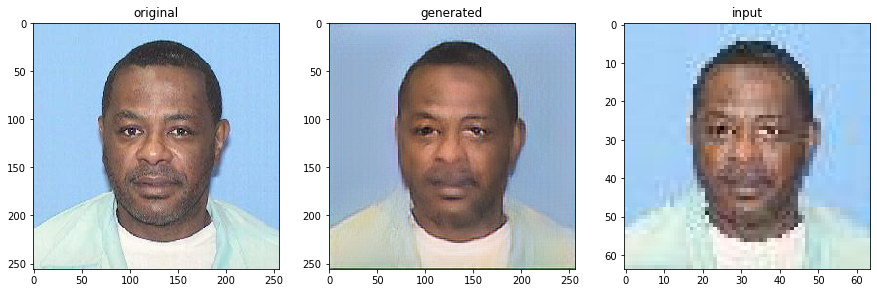

Generator loss (D): 7.5713592 | Generator loss (VGG19): 32068.5390625


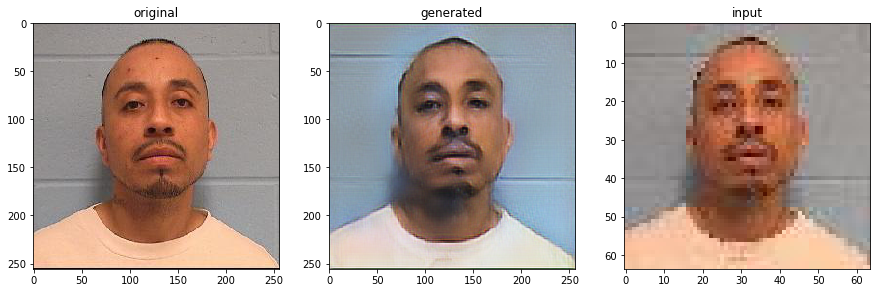

Generator loss (D): 2.5552938 | Generator loss (VGG19): 65754.859375


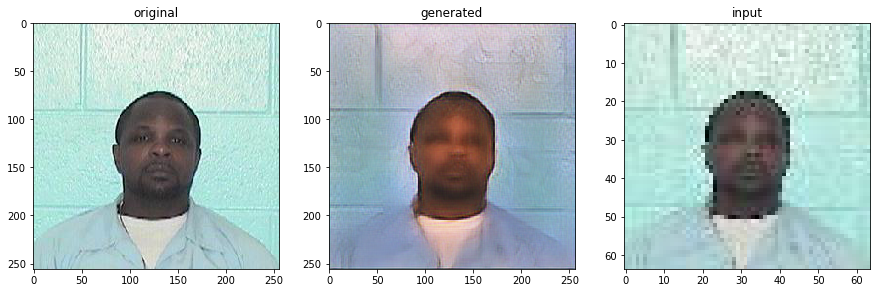

Generator loss (D): 7.9349976 | Generator loss (VGG19): 37141.4140625


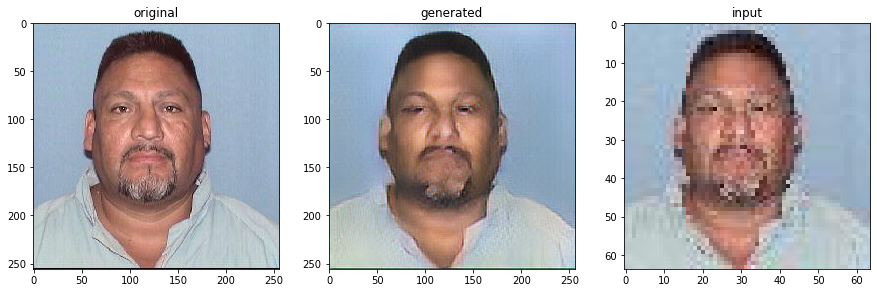

Generator loss (D): 3.8174646 | Generator loss (VGG19): 41646.8085938


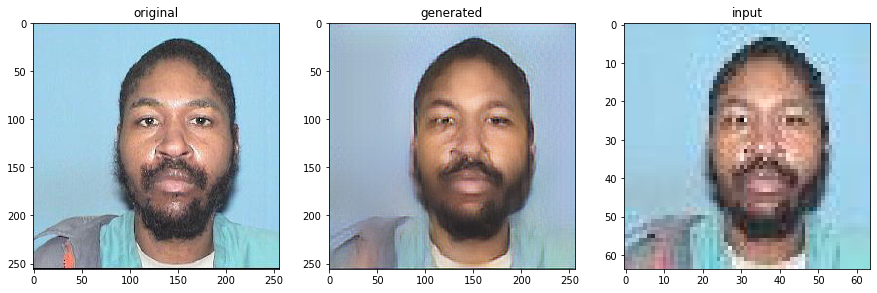

Generator loss (D): 5.7558937 | Generator loss (VGG19): 45766.7890625


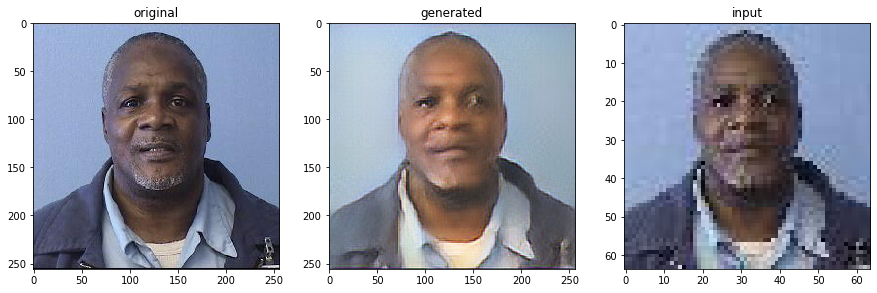

Generator loss (D): 8.0395823 | Generator loss (VGG19): 33948.6601562


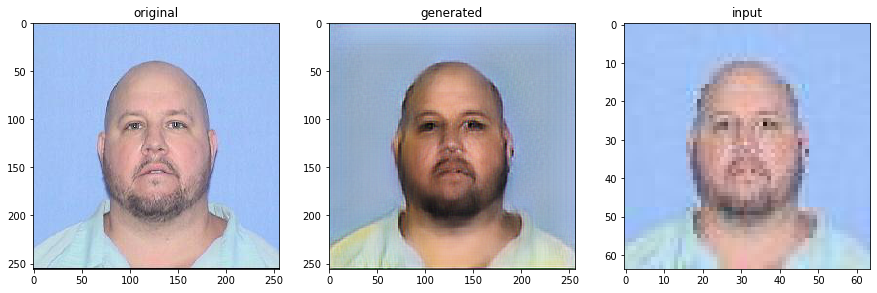

Generator loss (D): 5.801981 | Generator loss (VGG19): 42775.828125


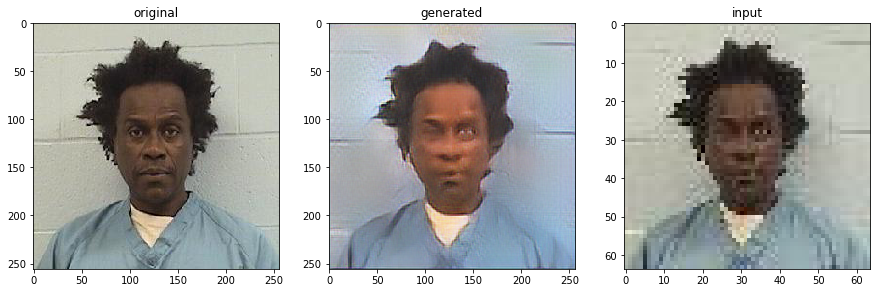

Generator loss (D): 6.9897051 | Generator loss (VGG19): 32956.8515625


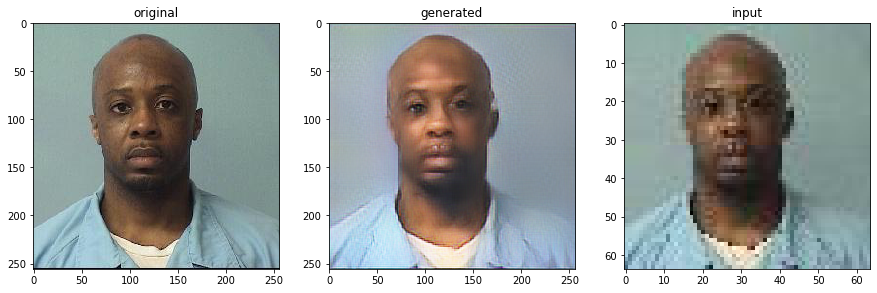

Generator loss (D): 6.8601251 | Generator loss (VGG19): 63245.2773438


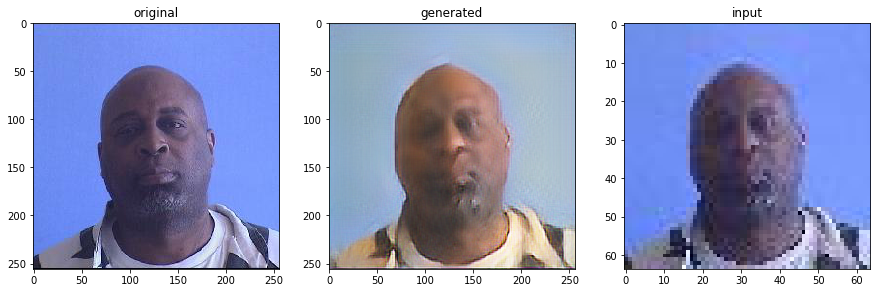

Generator loss (D): 5.687839 | Generator loss (VGG19): 41013.34375


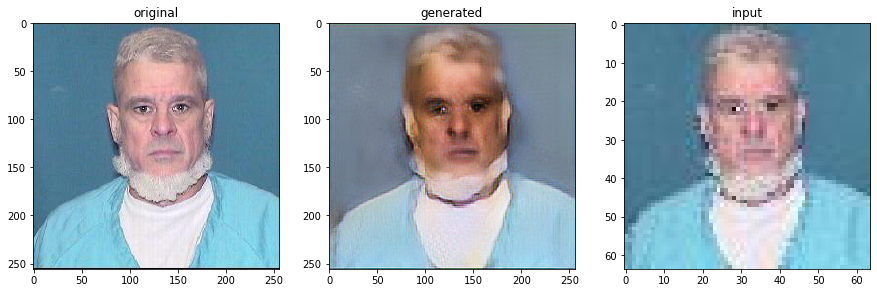

Generator loss (D): 8.6034851 | Generator loss (VGG19): 28325.7753906


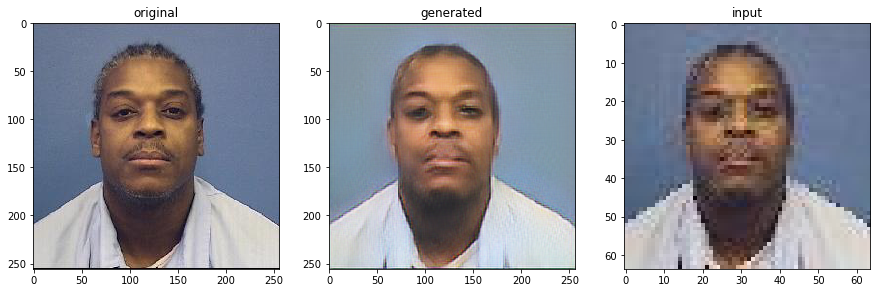

Generator loss (D): 2.8796337 | Generator loss (VGG19): 34619.703125


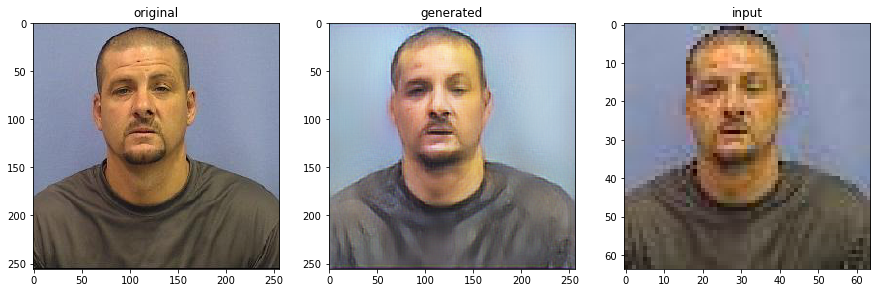

Generator loss (D): 2.3829408 | Generator loss (VGG19): 52881.2539062


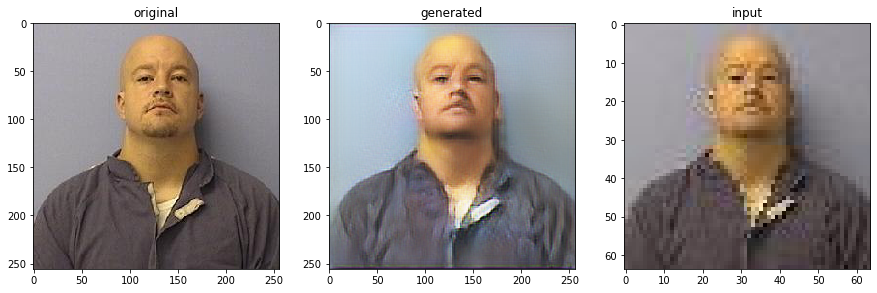

Generator loss (D): 8.1345749 | Generator loss (VGG19): 38303.9375


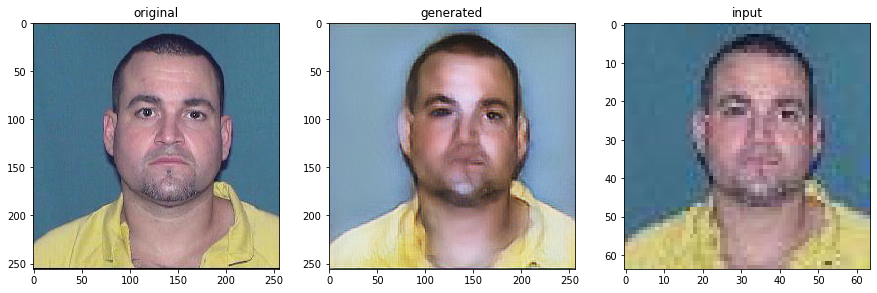

Generator loss (D): 5.7467823 | Generator loss (VGG19): 61952.0078125


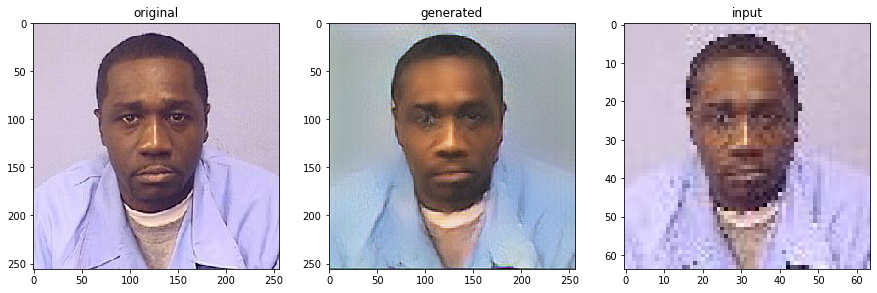

Generator loss (D): 7.8117867 | Generator loss (VGG19): 50139.1679688


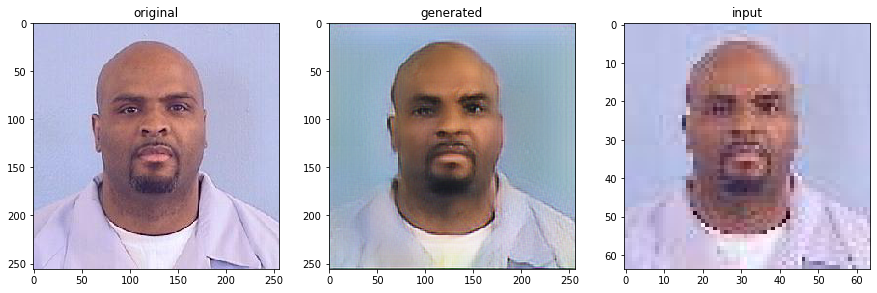

Generator loss (D): 5.2482367 | Generator loss (VGG19): 60446.46875


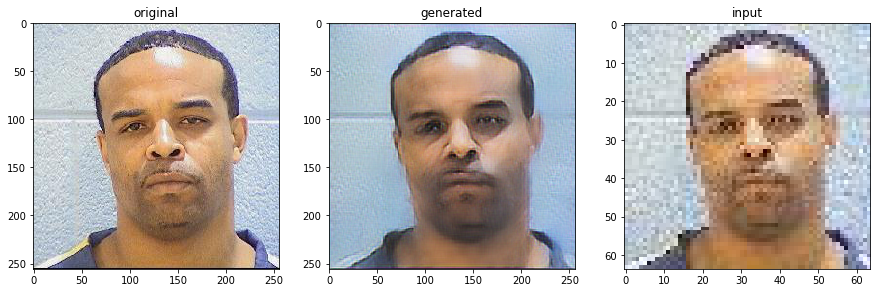

Generator loss (D): 5.9501877 | Generator loss (VGG19): 59602.296875


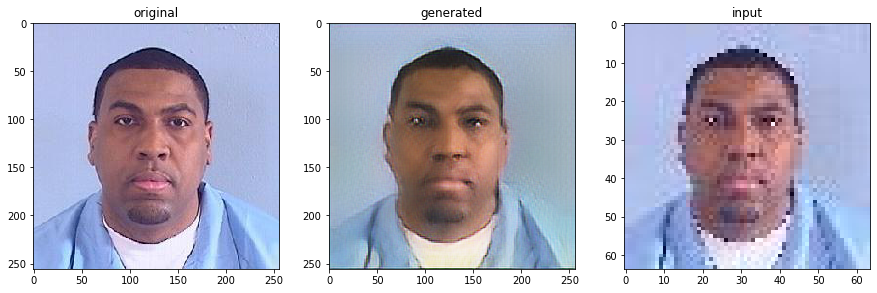

Generator loss (D): 3.8668683 | Generator loss (VGG19): 46490.2890625


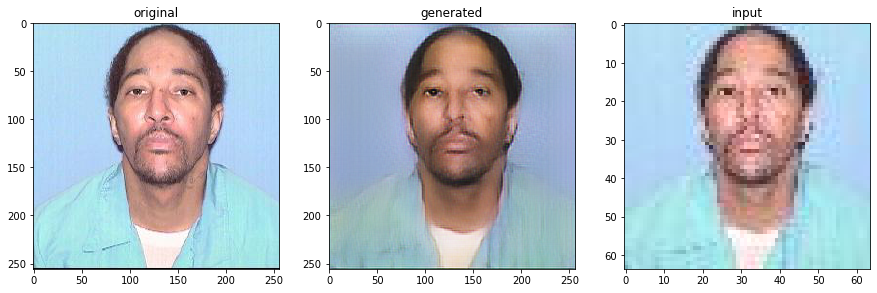

Generator loss (D): 3.8969512 | Generator loss (VGG19): 45519.0585938


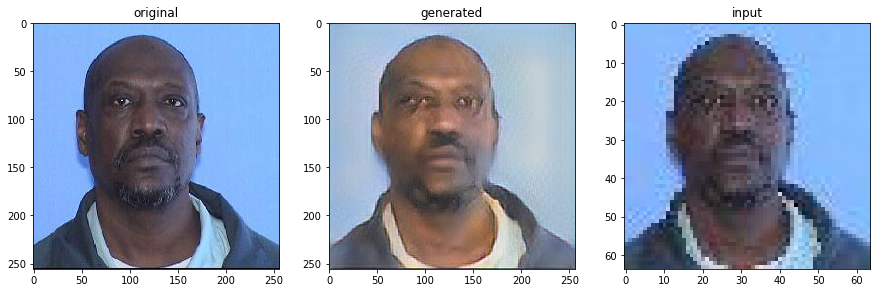

Generator loss (D): 3.9228632 | Generator loss (VGG19): 38407.359375


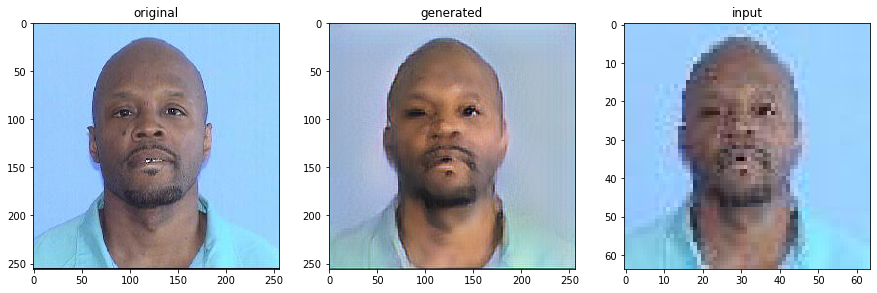

Generator loss (D): 7.5032697 | Generator loss (VGG19): 32399.1230469


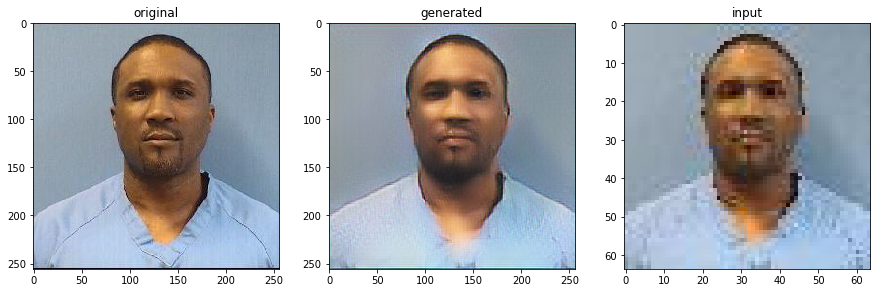

Generator loss (D): 5.962976 | Generator loss (VGG19): 44795.25


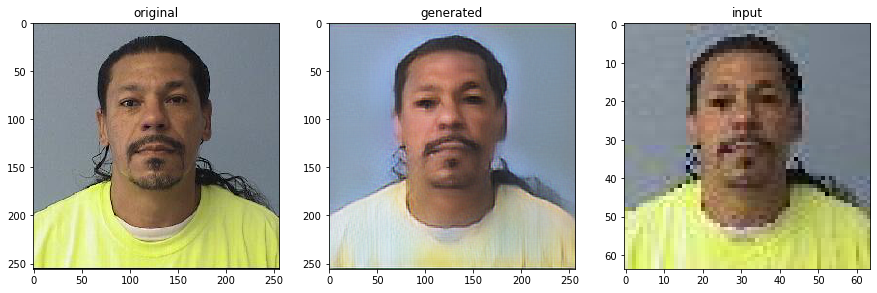

Generator loss (D): 1.506268 | Generator loss (VGG19): 61714.296875


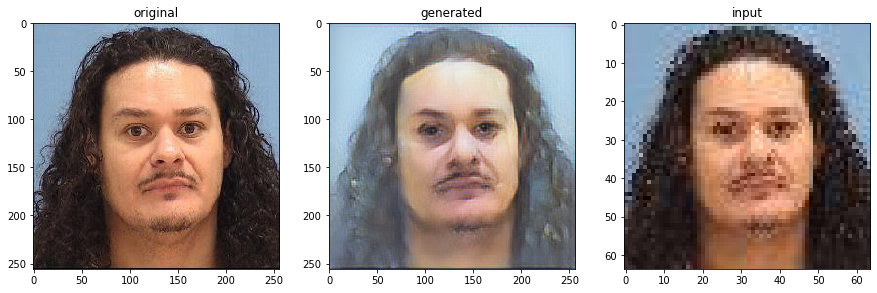

Generator loss (D): 7.1160746 | Generator loss (VGG19): 49247.890625


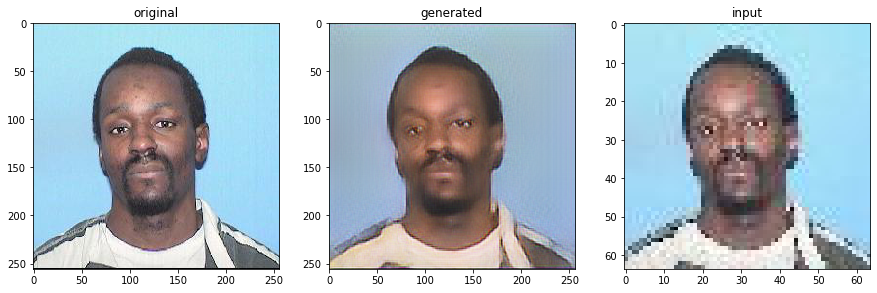

Generator loss (D): 6.3799038 | Generator loss (VGG19): 36584.0234375


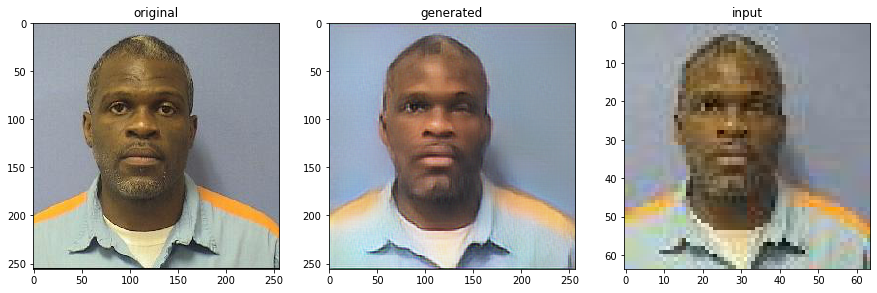

Generator loss (D): 6.5047975 | Generator loss (VGG19): 47299.6523438


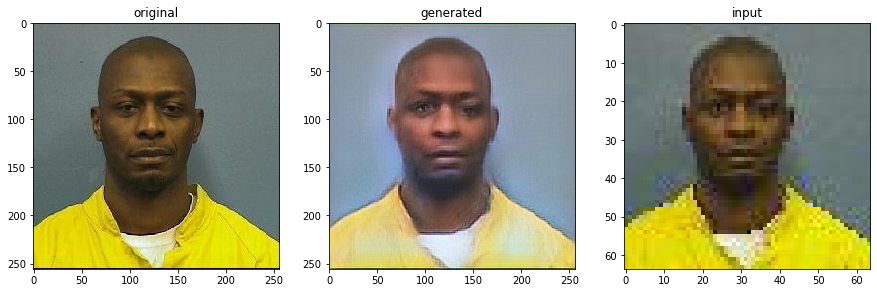

Generator loss (D): 8.2027063 | Generator loss (VGG19): 47403.3320312


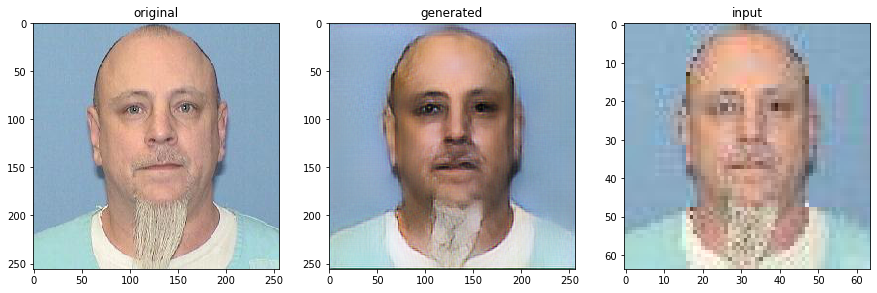

Generator loss (D): 6.1287847 | Generator loss (VGG19): 37002.203125


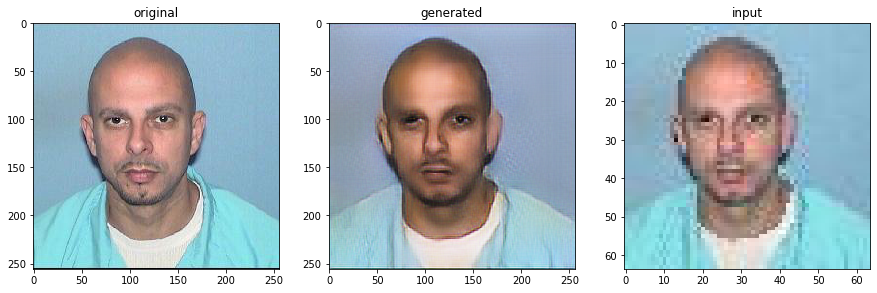

Generator loss (D): 3.3847752 | Generator loss (VGG19): 38660.296875


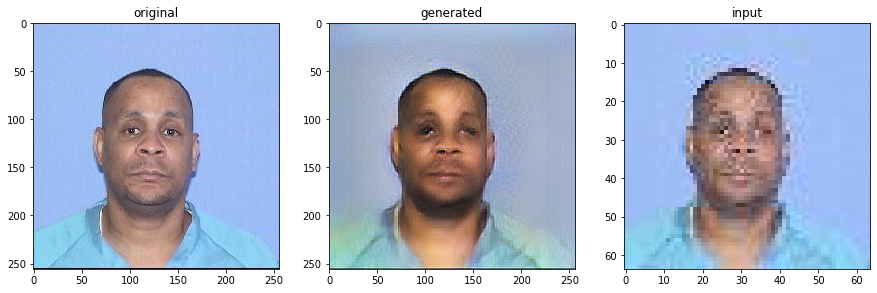

Generator loss (D): 2.9069586 | Generator loss (VGG19): 45866.625


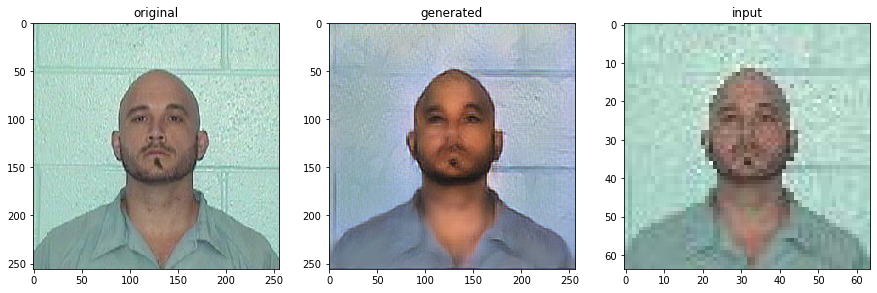

Generator loss (D): 5.136404 | Generator loss (VGG19): 40740.8867188


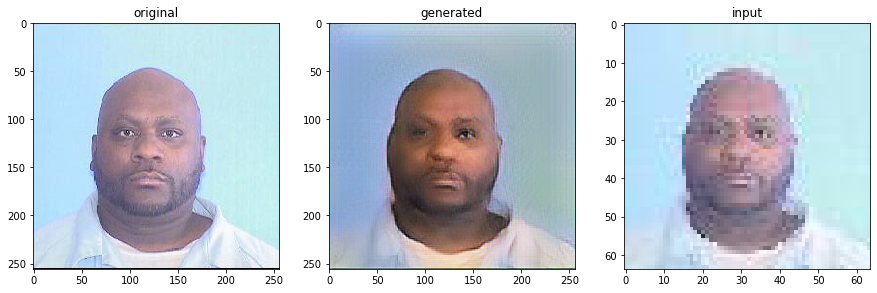

Generator loss (D): 6.7428432 | Generator loss (VGG19): 40766.6484375


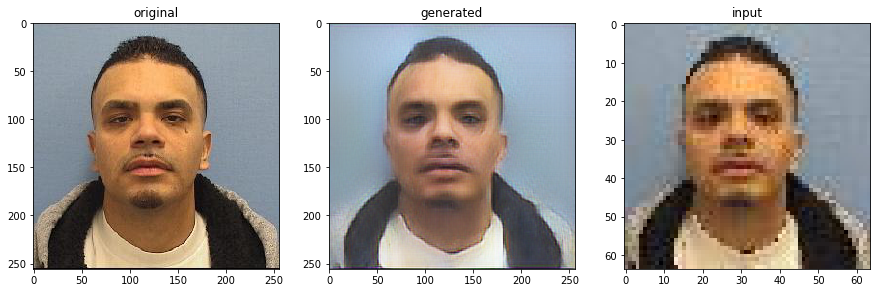

Generator loss (D): 6.8231134 | Generator loss (VGG19): 57703.03125


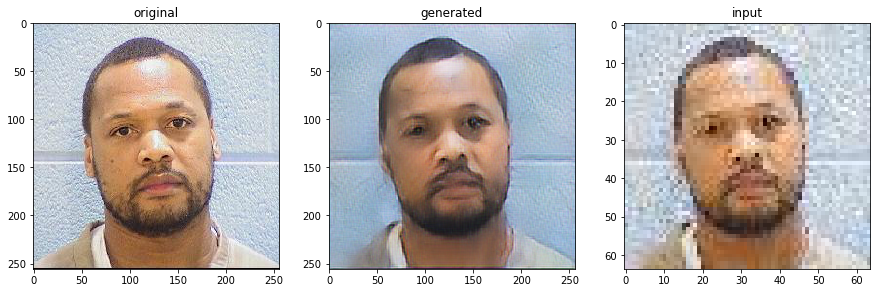

Generator loss (D): 6.8876257 | Generator loss (VGG19): 44468.9414062


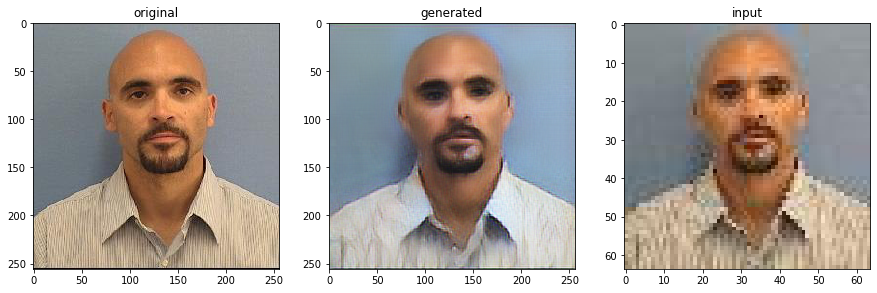

Generator loss (D): 5.8044348 | Generator loss (VGG19): 37263.8515625


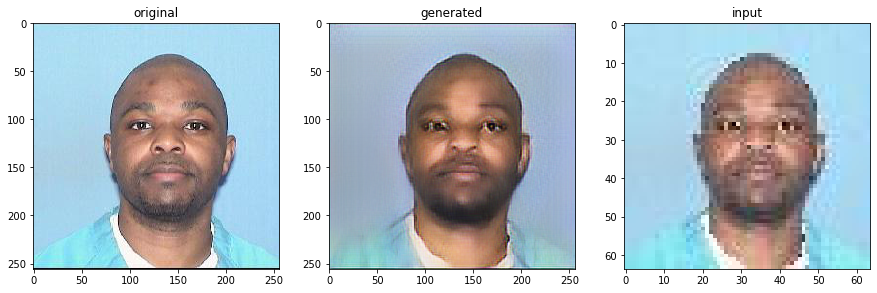

Generator loss (D): 7.8519721 | Generator loss (VGG19): 57493.4492188


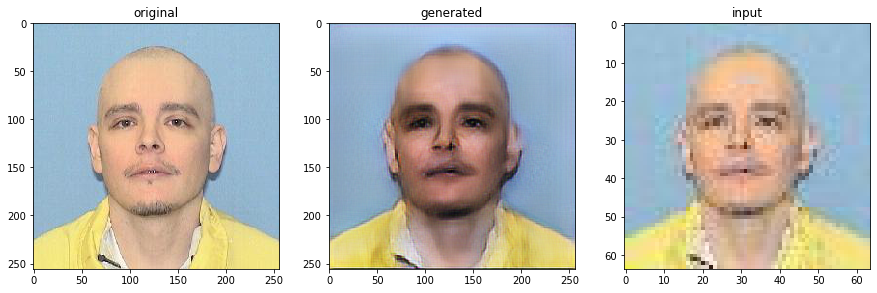

In [0]:
srgan.test()